**Importing neccessary libraries**

In [184]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
sns.set(style='darkgrid')
import warnings
warnings.filterwarnings('ignore')
from scipy import stats

**Loading the sampled dataset**

In [185]:
df=pd.read_csv('/home/tejaswini/Downloads/ML/data_HR_resample.csv')
df.head(5)

,Unnamed: 0,SLNO,Candidate.Ref,DOJ.Extended,Duration.to.accept.offer,Notice.period,Offered.band,Pecent.hike.expected.in.CTC,Percent.hike.offered.in.CTC,Percent.difference.CTC,Joining.Bonus,Candidate.relocate.actual,Gender,Candidate.Source,Rex.in.Yrs,LOB,Location,Age,Status
0,10,13,2151180,No,120,30,E2,5.26,-60.53,-62.50,No,No,Male,Employee Referral,3,INFRA,Noida,34,1
1,12,15,2156236,Yes,14,30,E2,50.00,287.50,158.33,No,No,Male,Agency,7,INFRA,Noida,29,1
2,13,16,2158703,No,44,75,E2,45.45,60.00,10.00,No,No,Male,Direct,8,INFRA,Noida,34,1
3,14,17,2161257,No,7,30,E3,53.85,50.00,-2.50,No,No,Male,Employee Referral,5,INFRA,Noida,34,1
4,16,19,2166041,Yes,98,30,E2,50.00,165.36,76.91,No,No,Male,Agency,8,INFRA,Noida,36,1


In [186]:
df.drop(columns=['Unnamed: 0','SLNO'],inplace=True)

In [188]:
#split the data into dependent and independent
X=df.iloc[:,:-1]#independent
Y=df.iloc[:,-1]#dependent

In [189]:
#Create dummies
dum=pd.get_dummies(X)
dum.head()

,Candidate.Ref,Duration.to.accept.offer,Notice.period,Pecent.hike.expected.in.CTC,Percent.hike.offered.in.CTC,Percent.difference.CTC,Rex.in.Yrs,Age,DOJ.Extended_No,DOJ.Extended_Yes,...,Location_Bangalore,Location_Chennai,Location_Cochin,Location_Gurgaon,Location_Hyderabad,Location_Kolkata,Location_Mumbai,Location_Noida,Location_Others,Location_Pune
0,2151180,120,30,5.26,-60.53,-62.50,3,34,1,0,...,0,0,0,0,0,0,0,1,0,0
1,2156236,14,30,50.00,287.50,158.33,7,29,0,1,...,0,0,0,0,0,0,0,1,0,0
2,2158703,44,75,45.45,60.00,10.00,8,34,1,0,...,0,0,0,0,0,0,0,1,0,0
3,2161257,7,30,53.85,50.00,-2.50,5,34,1,0,...,0,0,0,0,0,0,0,1,0,0
4,2166041,98,30,50.00,165.36,76.91,8,36,0,1,...,0,0,0,0,0,0,0,1,0,0


In [190]:
#split data into training and testing
np.random.seed(1001)
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(dum,Y,test_size=0.3)

In [191]:
x_train.shape,x_test.shape,y_train.shape,y_test.shape

((9096, 43), (3899, 43), (9096,), (3899,))

# Decision Tree

In [192]:
from sklearn.tree import DecisionTreeClassifier #Classification Tree
from sklearn.tree import export_graphviz #visualizing tree

In [193]:
model=DecisionTreeClassifier(criterion='entropy',max_depth=None)
# max depth is the no of rules generally low rules

In [194]:
model.fit(x_train,y_train)

DecisionTreeClassifier(class_weight=None, criterion='entropy', max_depth=None,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

# Evaluation

- confusion matrix
- kappa
- ROC and AUC

In [195]:
from sklearn.metrics import confusion_matrix,classification_report
from sklearn.metrics import cohen_kappa_score,roc_auc_score
from sklearn.metrics import roc_curve,auc

In [196]:
y_pred=model.predict(x_test)

In [197]:

#default threshold is 0.5 for y predict
#confusion matrix
cm=confusion_matrix(y_test,y_pred)
print(cm)
print('-'*20)
cr=classification_report(y_test,y_pred)
print(cr)
print('-'*20)
kappa_score=cohen_kappa_score(y_test,y_pred)
print("kappa score = ",kappa_score)
print('-'*20)
auc_score=roc_auc_score(y_test,y_pred)
print('AUC score',auc_score)

[[1797  429]
 [ 124 1549]]
--------------------
              precision    recall  f1-score   support

           0       0.94      0.81      0.87      2226
           1       0.78      0.93      0.85      1673

    accuracy                           0.86      3899
   macro avg       0.86      0.87      0.86      3899
weighted avg       0.87      0.86      0.86      3899

--------------------
kappa score =  0.7169244653407749
--------------------
AUC score 0.8665796388816837


# ROC curve

In [198]:
y_prob_pred=model.predict_proba(x_test)
y_prob=y_prob_pred[:,1]
y_prob_pred

array([[0., 1.],
       [0., 1.],
       [0., 1.],
       ...,
       [1., 0.],
       [1., 0.],
       [0., 1.]])

In [199]:
fpr,tpr,thresh=roc_curve(y_test,y_pred)

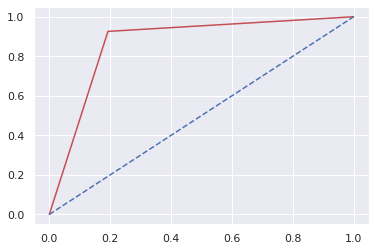

In [200]:
plt.plot(fpr,tpr,'r')
plt.plot([0,1],[0,1],'b--')
plt.show()

In [201]:
y_pred_prob=model.predict_proba(x_test)[:,1]#considering 1 probability

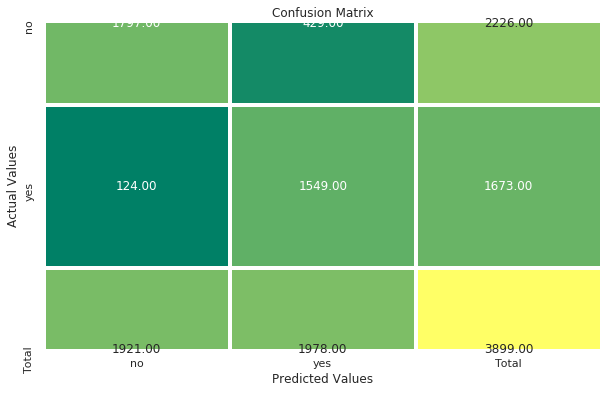

******************************Classifcation Report******************************


              precision    recall  f1-score   support

           0       0.94      0.81      0.87      2226
           1       0.78      0.93      0.85      1673

    accuracy                           0.86      3899
   macro avg       0.86      0.87      0.86      3899
weighted avg       0.87      0.86      0.86      3899


************************************Kappa Score************************************


Kappa Score = 0.7169244653407749

******************************Area Under Curve Score******************************


AUC Score = 0.8665796388816837
Number of probabilities to build ROC = 3


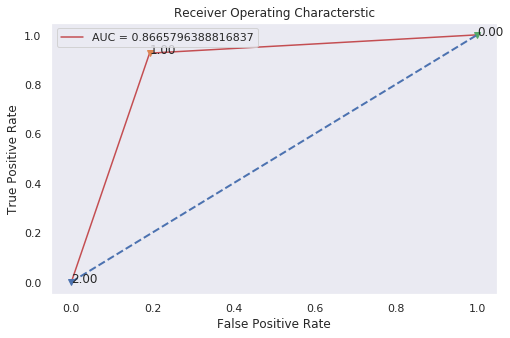

In [202]:
innomatics.classification_metric(y_test,y_pred,y_pred_prob,['no','yes'],n=1,verbose=True)

In [203]:
#pydot is used for visualizing trees

In [204]:
import pydotplus

In [205]:
export_graphviz(model,out_file='HR_.odt',feature_names=x_train.columns,filled=True)

In [206]:
graph=pydotplus.graph_from_dot_file('HR_.odt')

In [207]:
graph.write_pdf('HR_tree.pdf')

True

In [208]:
graph.write_jpg('HR_tree.jpg')

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.574346 to fit



True

In [209]:
from IPython.display import Image
Image("HR_tree.jpg")

# Grid Search CV

In [210]:
from sklearn.model_selection import GridSearchCV#gridsearch cross validation
#hyperparameter tuning
#inorder to find at which depth we get best auc i.e., less loss

In [211]:
model_tune=DecisionTreeClassifier()

In [212]:
tuned_parameter=[{'criterion':['gini','entropy'],'max_depth':range(2,10)}]

In [213]:
strat=GridSearchCV(model_tune,param_grid=tuned_parameter,cv=10,scoring='roc_auc')

In [214]:
strat.fit(x_train,y_train)

GridSearchCV(cv=10, error_score='raise-deprecating',
             estimator=DecisionTreeClassifier(class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort=False, random_state=None,
                                              splitter='best'),
             iid='warn', n_jobs=None,
             param_grid=[{'criterion': ['gini', 'entropy'],
                          'max_depth': range(2, 10)}],
             pre_dis

In [215]:
strat.best_score_

0.791713580689389

In [216]:
strat.best_params_


{'criterion': 'gini', 'max_depth': 9}

In [217]:
#we can build model with this parameters to get rules

In [218]:
model1=DecisionTreeClassifier(criterion='gini',max_depth=9)

In [219]:
model1.fit(x_train,y_train)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=9,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

In [220]:
y_pred1=model1.predict(x_test)
y_pred1

array([0, 1, 0, ..., 0, 0, 1])

In [221]:
export_graphviz(model1,out_file='HR__.odt',feature_names=x_train.columns,filled=True)

In [222]:
graph1=pydotplus.graph_from_dot_file('HR__.odt')

In [223]:
graph1.write_jpg('HR__tree.jpg')

True

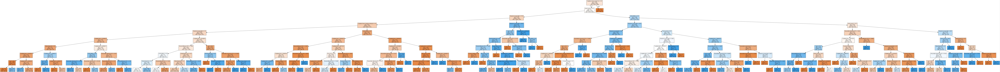

In [224]:
from IPython.display import Image
Image("HR__tree.jpg")

In [226]:

#default threshold is 0.5 for y predict
#confusion matrix
cm=confusion_matrix(y_test,y_pred1)
print(cm)
print('-'*20)
cr=classification_report(y_test,y_pred1)
print(cr)
print('-'*20)
kappa_score=cohen_kappa_score(y_test,y_pred1)
print("kappa score = ",kappa_score)
print('-'*20)
auc_score=roc_auc_score(y_test,y_pred1)
print('AUC score',auc_score)

[[1579  647]
 [ 481 1192]]
--------------------
              precision    recall  f1-score   support

           0       0.77      0.71      0.74      2226
           1       0.65      0.71      0.68      1673

    accuracy                           0.71      3899
   macro avg       0.71      0.71      0.71      3899
weighted avg       0.72      0.71      0.71      3899

--------------------
kappa score =  0.41670086209617674
--------------------
AUC score 0.7109183216983012


**Here we can see the worst kappa score,So there is no need to model the data after having criterian: gini and max_depth: 9**